# Custom Training with YOLOv5

In this tutorial, we assemble a dataset and train a custom YOLOv5 model to recognize the objects in our dataset. To do so we will take the following steps:

* Gather a dataset of images and label our dataset
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate our YOLOv5 model's performance
* Run test inference to view our model at work



In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pwd


/content


In [ ]:
%cd /content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/


/content/drive/MyDrive/Ineuron_DeepLearning/Object_detection


# Step 1: Install Requirements

In [ ]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/yolov5
Setup complete. Using torch 1.11.0+cu113 (CPU)


# STEP2: Preprocessing the Data

How to Downloda the dataset from roboflow public dataset?
- 1.Select the small data set e.g 
https://www.kaggle.com/datasets/nguyngiabol/colorful-fashion-dataset-for-object-detection

- 2.Manually split the Train and Test data and save the images into fashion/images/train and fashion/images/test folder.

- 3.copy the corresponding annotation.txt files into 
     lables/train and label/test folder
- 4.Dataset does not contain the .txt annotation file

    https://blog.paperspace.com/train-yolov5-custom-data/
- 5.Refer above link for how to convert xml to Yolo5 formated (txt)? and also Train and Test split.
- 6.Create the data.ymal file under fashion folder as below
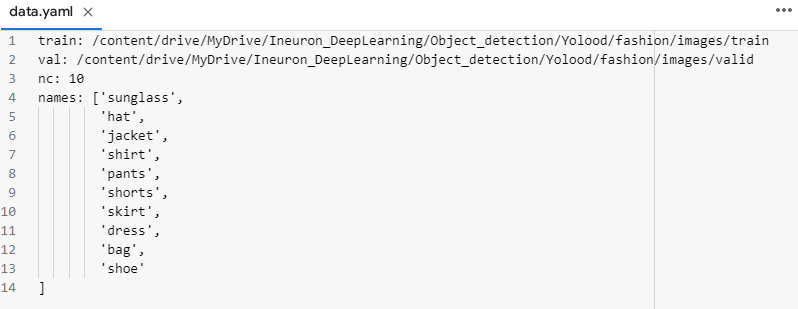


In [ ]:
import os

In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/Yolood/fashion"

# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:


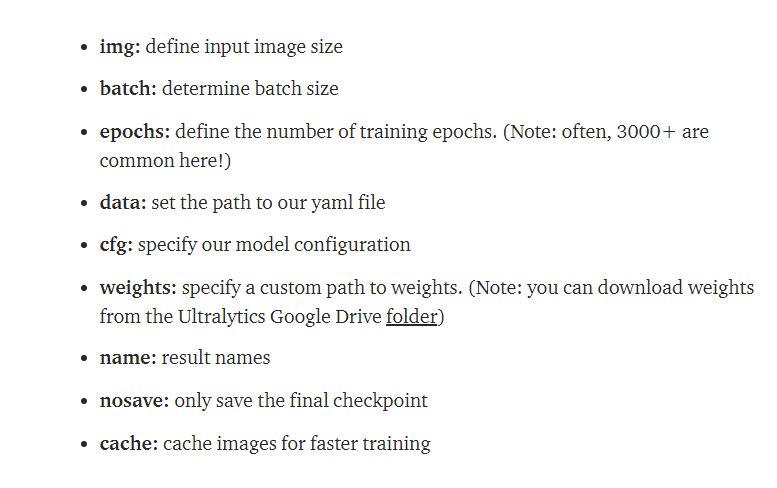

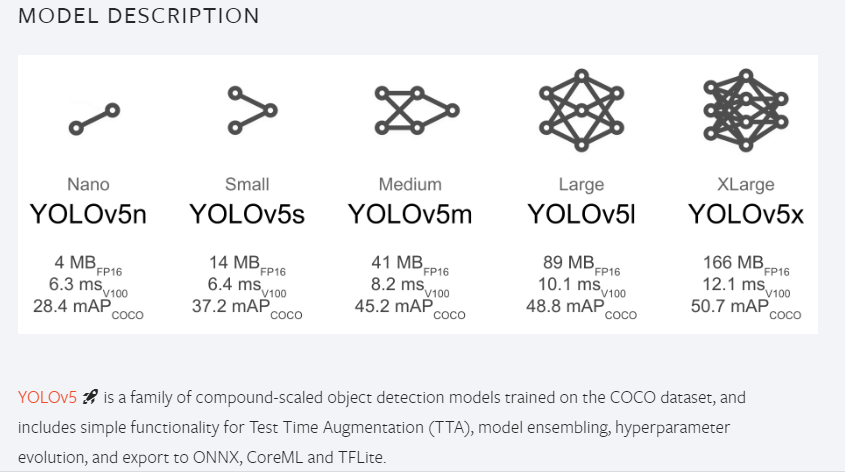

# Train the model and store the weights into specified path

In [ ]:
!pwd

/content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/yolov5


In [ ]:
%cd /content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/yolov5

/content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/yolov5


- Update the data.yaml file 
training and val path:

/content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/Yolood/fashion/data.yaml

In [ ]:
# First time Training
!python train.py --img 640 \
--batch-size 32 \
--epochs 5 \
--data /content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/Yolood/fashion/data.yaml \
--cfg /content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/yolov5/models/yolov5s.yaml\
 --name /content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/Yolood/fashion\Model

train: weights=yolov5s.pt, cfg=/content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/yolov5/models/yolov5s.yaml, data=/content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/Yolood/fashion/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=5, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=/content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/Yolood/fashionModel, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 69 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v6.1-172-ge305aba torch 1.11.0+cu113 CUDA:0 (Tes

In [ ]:
!pwd

/content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/yolov5


In [ ]:
%cd /content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/yolov5

/content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/yolov5


# Resume the Training 

In [ ]:
#https://stackoverflow.com/questions/70374832/yolov5-can-i-add-more-epochs-on-the-model-already-done-custom-training
!python train.py --img 640 \
--batch-size 32 \
--epochs 1000 \
--data /content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/Yolood/fashion/data.yaml \
 --weights /content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/Yolood/fashionModel/weights/best.pt --cache --exist-ok

train: weights=/content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/Yolood/fashionModel/weights/best.pt, cfg=, data=/content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/Yolood/fashion/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=1000, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=True, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 1867, done.
remote: Counting objects: 100% (839/839), done.
remote: Compressing objects: 100% (12/12), done.
Command 'git fetch && git config --get remote.origin.url' timed out after 5 seconds
YOLOv5 🚀 v6.1-172-ge305aba torch 1.11.0

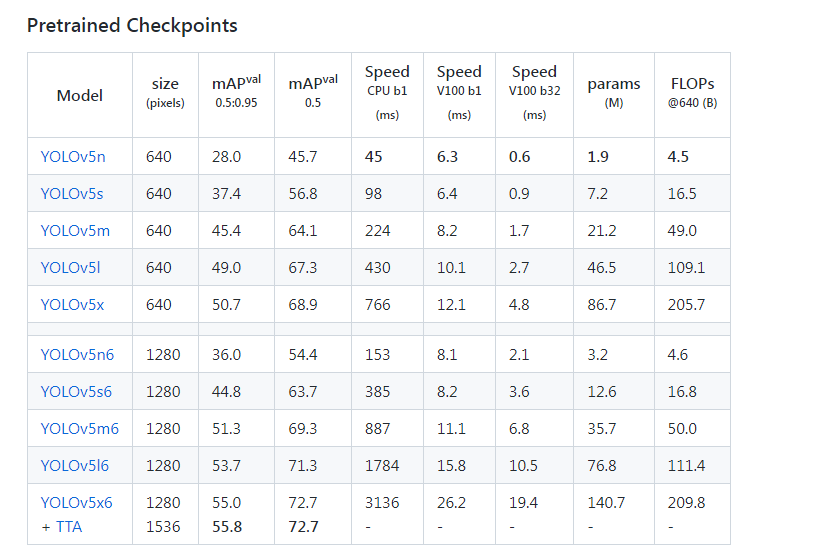

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
#
%tensorboard --logdir /content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/yolov5/runs/train/exp

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
!python detect.py --conf 0.5 \
--weights /content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/yolov5/runs/train/fashion_model5/weights/best.pt \
--source /content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/Yolood/fashion/Sample_Images

detect: weights=['/content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/yolov5/runs/train/fashion_model5/weights/best.pt'], source=/content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/Yolood/fashion/Sample_Images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-172-ge305aba torch 1.11.0+cu113 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7037095 parameters, 0 gradients, 15.9 GFLOPs
image 1/10 /content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/Yolood/fashion/Sample_Images/105720.jpg: 640x448 1 shirt, Done. (0.280s)
image 2/10 /content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/Yolood/fashion/Sample_Images/10

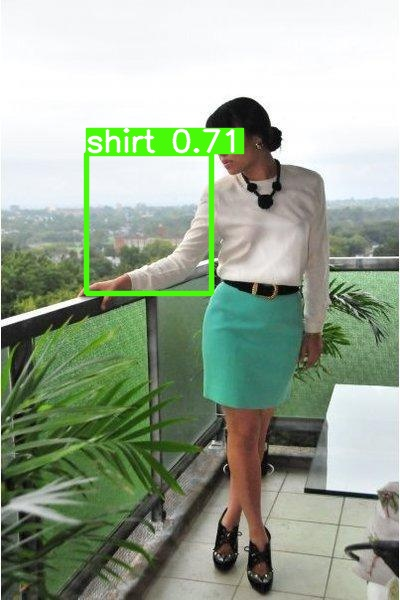

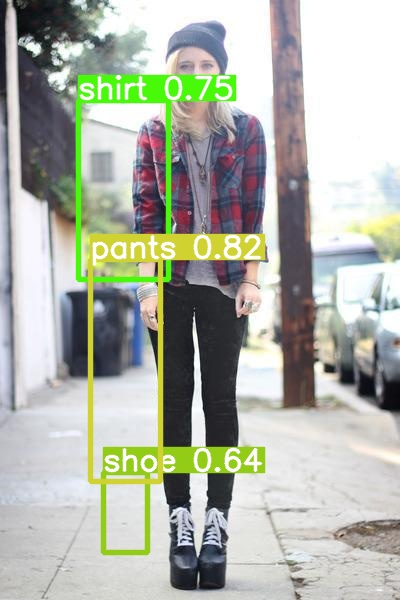

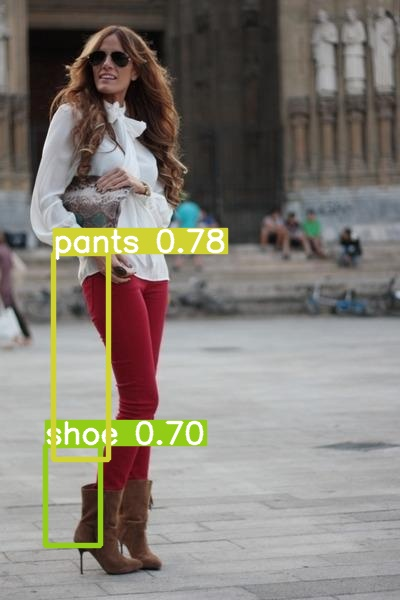

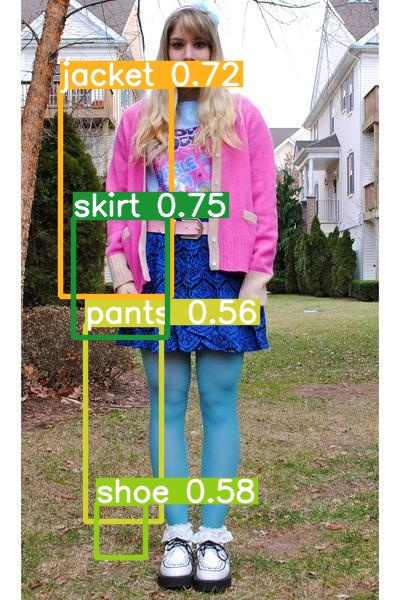

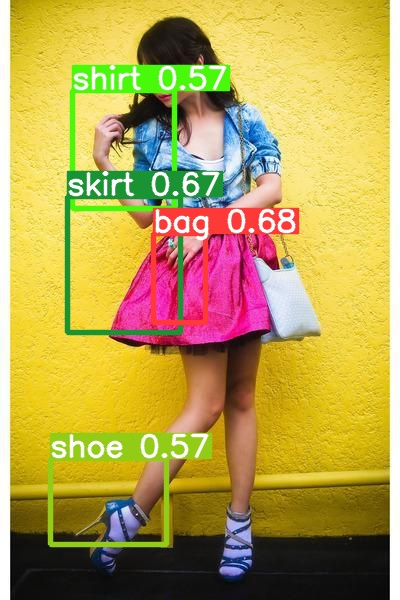

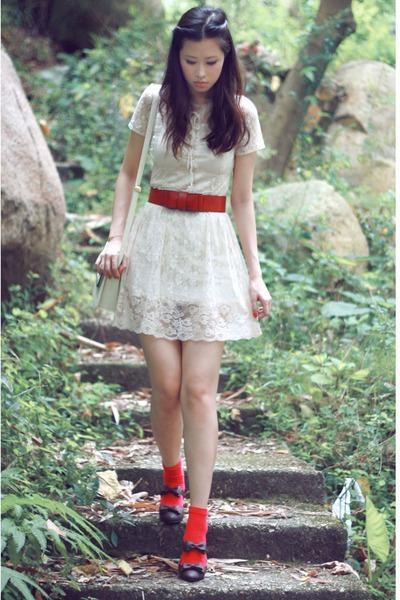

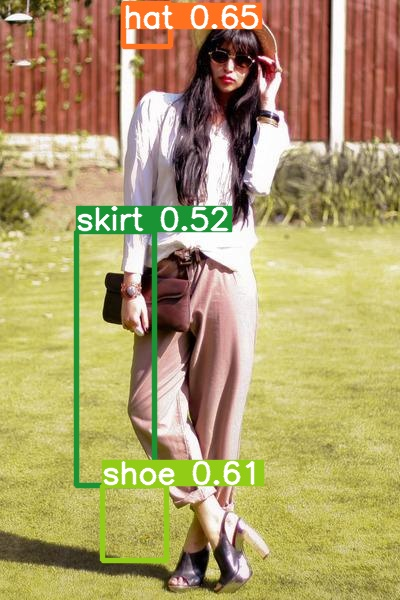

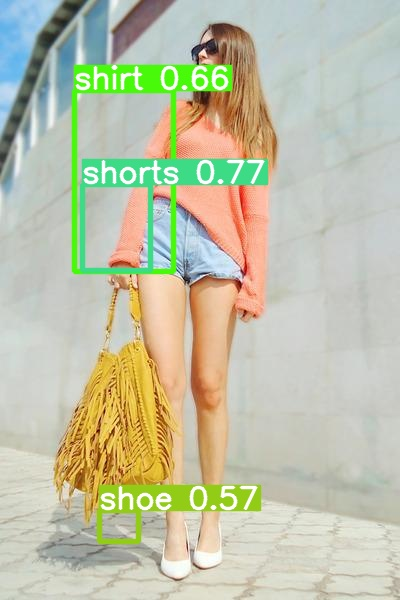

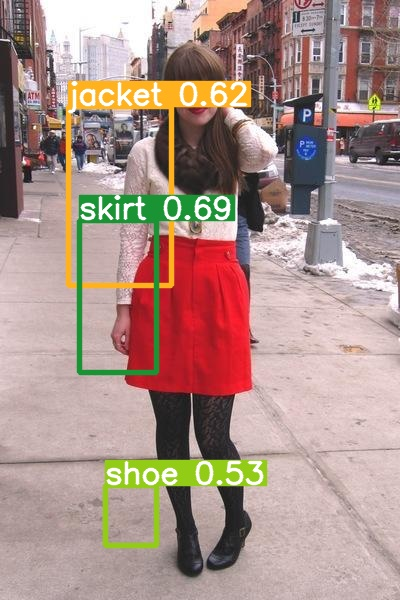

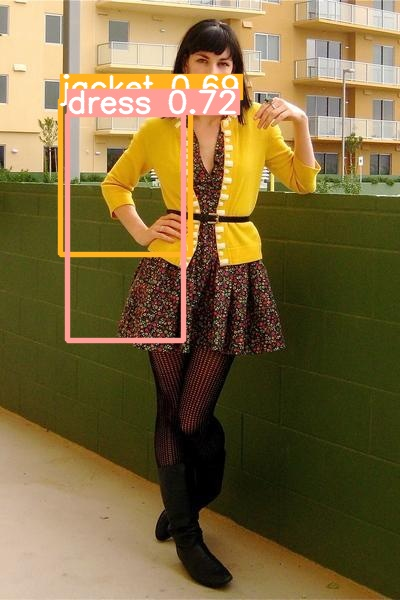

In [5]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/Ineuron_DeepLearning/Object_detection/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).